In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

from muon.deep_clustering.clustering import Config, Cluster
from muon.utils.subjects import Subjects
from muon.deep_clustering.mapping import Mapping

import os
import pickle
import math
import logging
import numpy as np
import pandas as pd
import csv
logger = logging.getLogger(__name__)

config = 'mnt/dec/dec_no_labels/config_jupyter.json'
config = Config.load(config)
print(config.__dict__)
subjects = pickle.load(open(config.subjects, 'rb'))
# cluster = Cluster.create(subjects, config)

import muon.project.parse_export as pe
agg = pe.Aggregate.load('mh2')

Using TensorFlow backend.


{'update_interval': 140, 'ae_weights': 'mnt/dec/dec_no_labels/ae_weights.h5', 'momentum': 0.9, 'rotation': False, 'lr': 0.01, 'maxiter': 20000.0, 'tol': 0.001, 'save_dir': 'mnt/dec/dec_no_labels', 'n_clusters': 50, 'batch_size': 256, 'nodes': [500, 500, 2000, 10], 'subjects': 'mnt/dec/dec_no_labels/subjects.pkl'}


In [2]:
_s = list(agg.data['subjects'].keys())
subjects2 = subjects.subset(_s)
agg.apply_labels(subjects2)
cluster = Cluster.create(subjects2, config)
print('Initializing model')
cluster.initialize()

Initializing model
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 499)               0         
_________________________________________________________________
encoder_0 (Dense)            (None, 500)               250000    
_________________________________________________________________
encoder_1 (Dense)            (None, 500)               250500    
_________________________________________________________________
encoder_2 (Dense)            (None, 2000)              1002000   
_________________________________________________________________
encoder_3 (Dense)            (None, 10)                20010     
_________________________________________________________________
clustering (ClusteringLayer) (None, 50)                500       
Total params: 1,523,010
Trainable params: 1,523,010
Non-trainable params: 0
_______________________________________________

In [3]:
def load_set(fname):
    with open(fname, 'r') as file:
        reader = csv.DictReader(file)
        return [int(item['subject']) for item in reader]
train = load_set('mnt/training_set/train.csv')
validate = load_set('mnt/training_set/test.csv')

In [6]:
mapping = Mapping(cluster, agg, train, validate, mode='batched', size=1000)
# print(mapping.FOM)
# print(cluster.predict().cluster_mapping)

/home/larai002/.virtualenv/lucifer/muon/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/larai002/.virtualenv/lucifer/muon/lib/python3.5/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


[ 0.  0.  0. ...,  0.  1.  1.] None
[ 0.  1.  0. ...,  0.  1.  1.] None


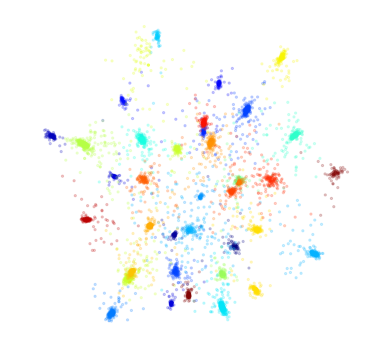

In [7]:
mapping.pca_plot()
plt.show()

In [13]:
# mapping.apply_mapping(epochs=10)
from keras.models import load_model
from dec_keras.DEC import ClusteringLayer
mapping.cluster.dec.model.load_weights('batched_weights.h5')

In [ ]:
# y_pred = cluster.predictions.y_pred
# y_true = cluster.subjects.get_charge_array()[1]
# print(y_pred.size)
# print(y_true.size)
# print(len(subjects2))
# agg.data['subjects']

In [15]:
pred=mapping.cluster.predict()

/home/larai002/.virtualenv/lucifer/muon/lib/python3.5/site-packages/numpy/core/fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/larai002/.virtualenv/lucifer/muon/lib/python3.5/site-packages/numpy/core/_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


In [26]:
cm = pred.cluster_mapping
print(cm[cm['majority_class_fraction']>= 0])

    n_assigned  majority_class  majority_class_fraction
2            1               0                 1.000000
3            4               0                 1.000000
5          258               0                 0.980620
9          886               0                 0.990971
18           1               1                 1.000000
20           1               1                 1.000000
25         136               0                 0.926471
26         395               0                 0.972152
27         693               0                 0.994228
34           8               1                 0.750000
42          22               1                 0.636364
45           1               1                 1.000000
49        7491               0                 0.586838


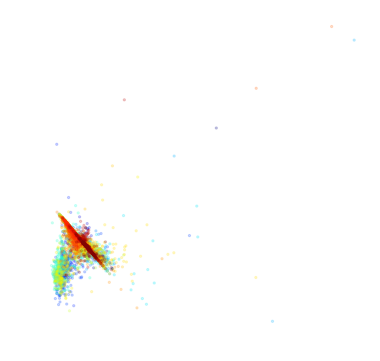

In [14]:
mapping.pca_plot()
plt.show()

number of subjects 886


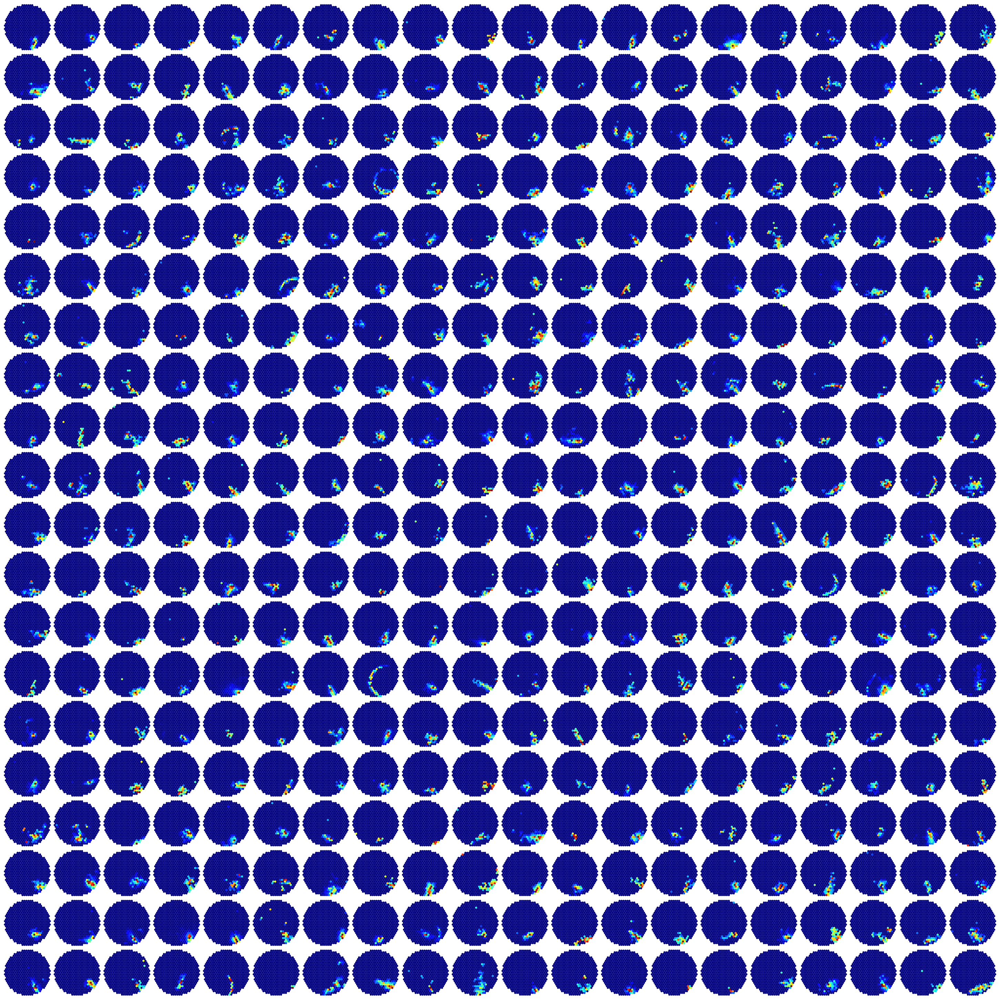

In [39]:
pred.cluster_subjects(9).plot_sample(400, w=20)
plt.show()

number of subjects 693


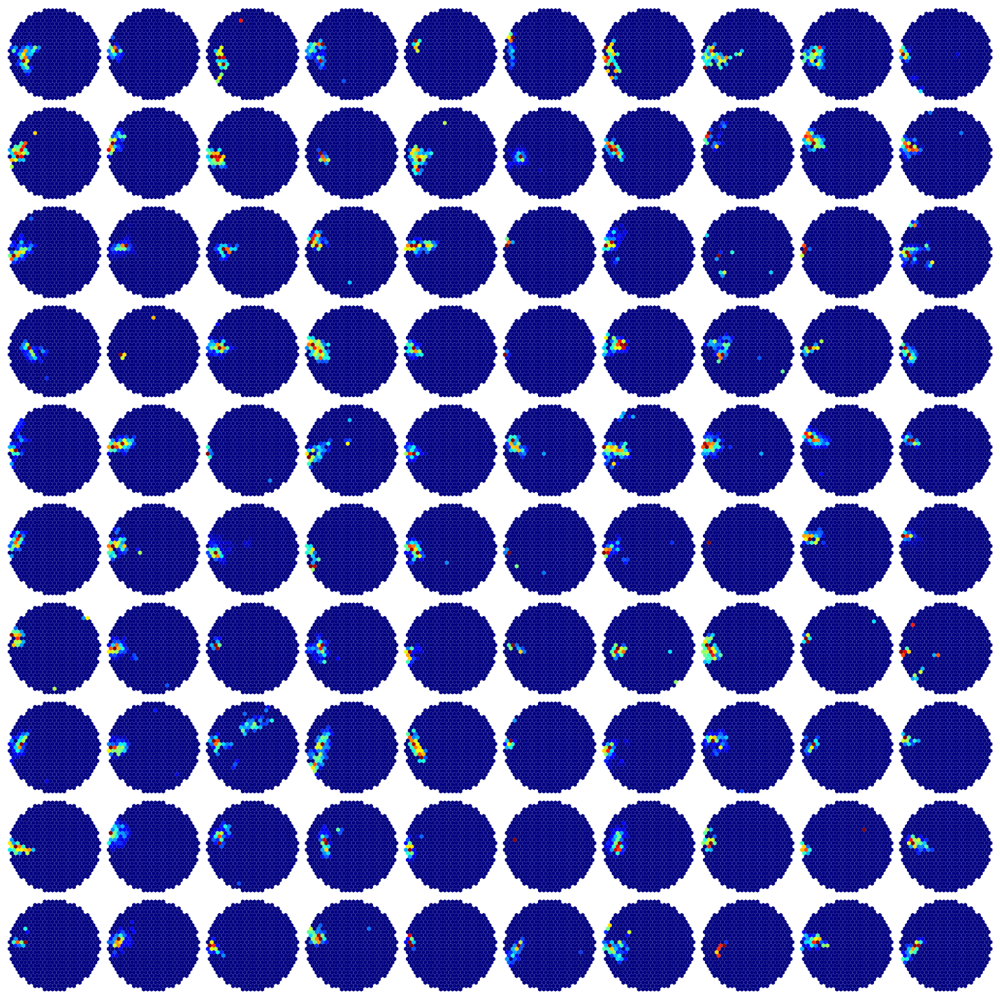

In [28]:
pred.cluster_subjects(27).plot_sample(100, w=10)
plt.show()

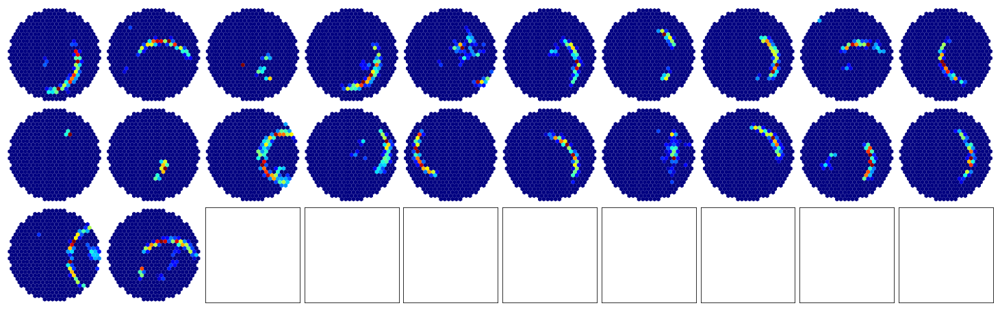

In [29]:
pred.cluster_subjects(42).plot_subjects(w=10)
plt.show()

number of subjects 4396


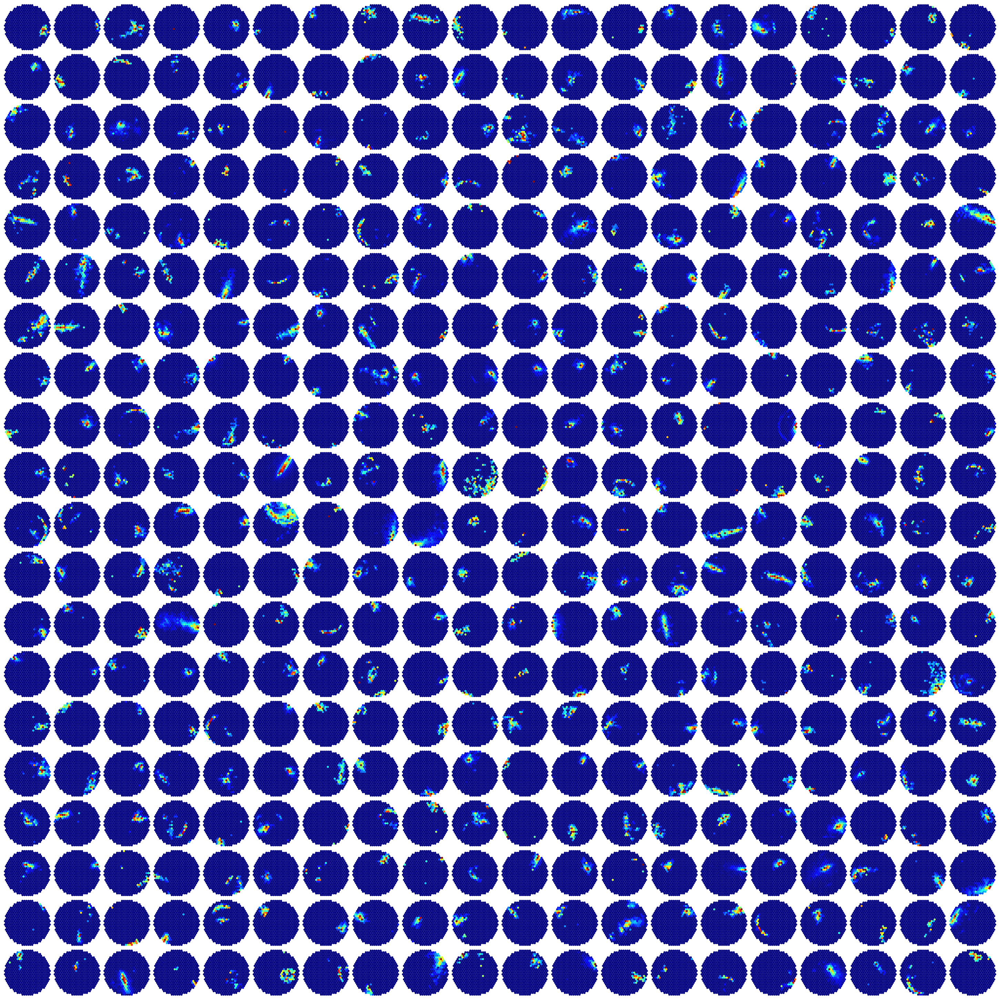

In [38]:
sample = pred.cluster_subjects(49)
sample = [s.id for s in sample.list() if s.label == 0]
sample = subjects.subset(sample)
sample.plot_sample(400, w=20)
plt.show()

number of subjects 3095


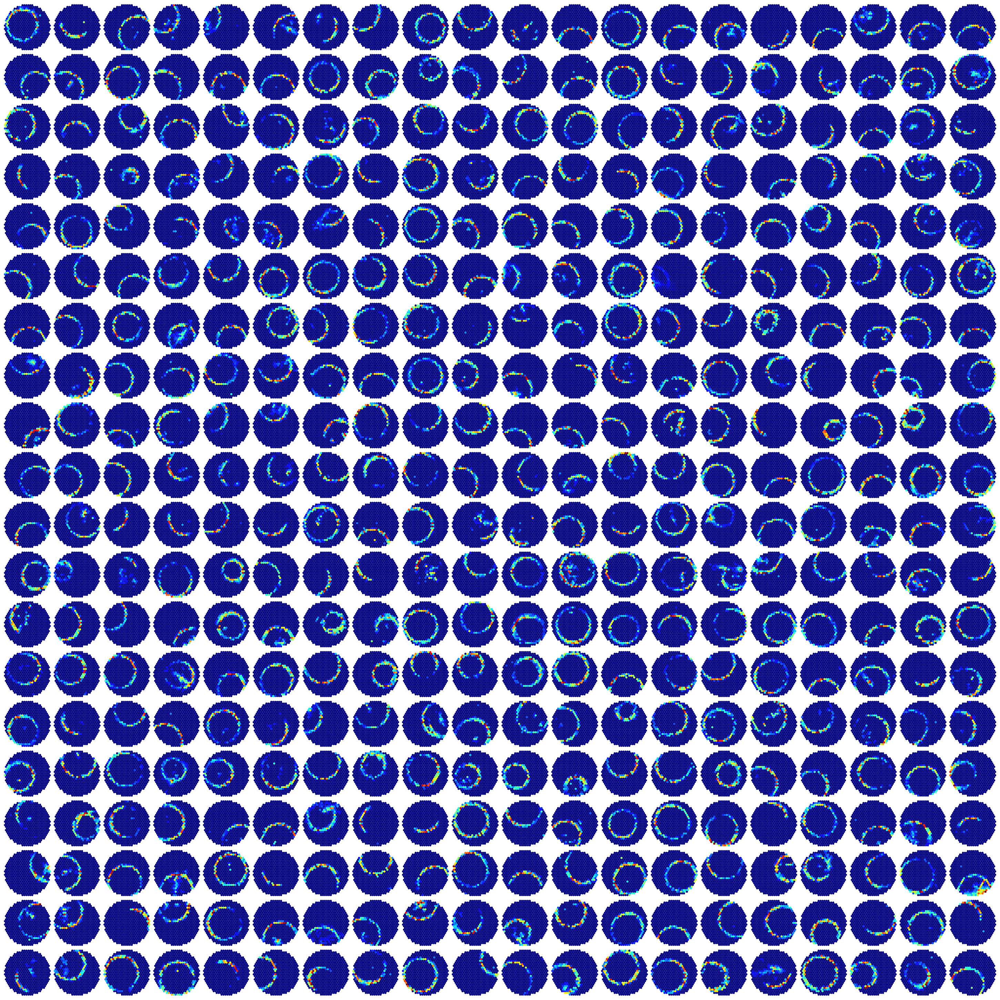

In [43]:
sample = pred.cluster_subjects(49)
sample = [s.id for s in sample.list() if s.label == 1]
sample = subjects.subset(sample)
sample.plot_sample(400, w=20)
plt.show()

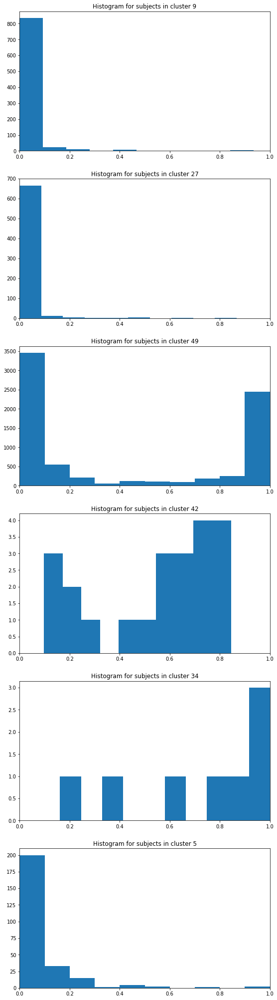

In [66]:
def test(cluster):
    subjects = pred.cluster_subjects(cluster)
    reduce = agg.reduce()[1]
    scores = [reduce[s.id] for s in subjects.list()]
    plt.hist(scores)
    plt.xlim([0,1])
    plt.title('Histogram for subjects in cluster %d' % cluster)

hist = [9,27,49, 42, 34, 5]
plt.figure(figsize=(9,6*len(hist)))
for i, h in enumerate(hist):
    plt.subplot(len(hist), 1, i+1)
    test(h)
plt.show()

In [75]:
r=agg.reduce()[1]
print(len(r))
len([s for s in r if r[s]==0 or r[s]==1])/len(r)
sum([len(agg.data['subjects'][s]) for s in [s for s in r if r[s]==0 or r[s]==1]])

9897


155906